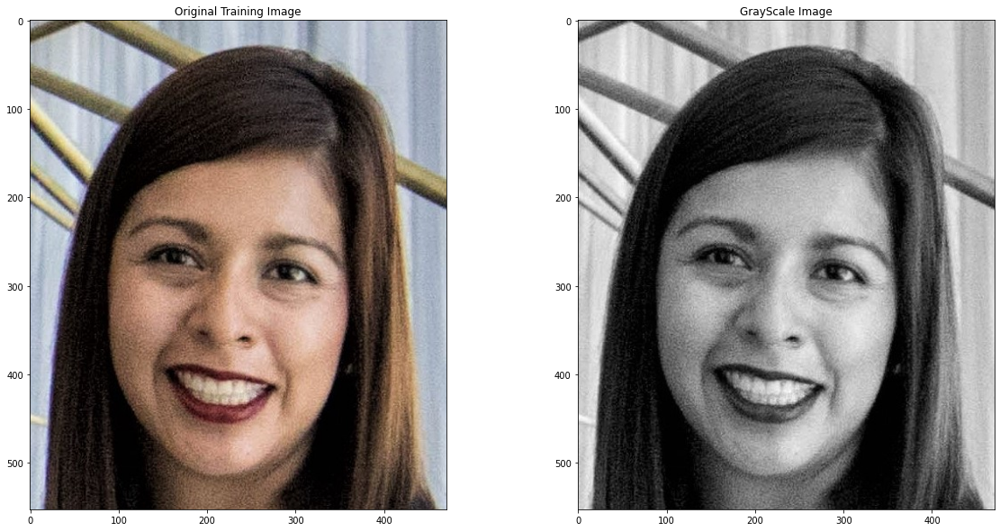

In [1]:
%matplotlib inline

import cv2
import matplotlib.pyplot as plt

# Set the default figure size
plt.rcParams['figure.figsize'] = [20,10]

# Load the training image
image = cv2.imread('./images/face.jpeg')

# Convert the training image to RGB
rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Convert the training image to gray Scale
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

plt.subplot(121)
plt.title('Original Training Image')
plt.imshow(rgb)
plt.subplot(122)
plt.title('GrayScale Image')
plt.imshow(gray,cmap='gray')

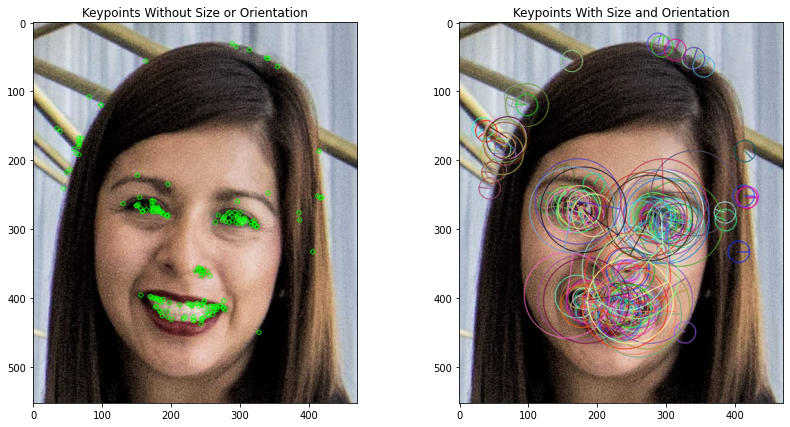


Number of keypoints Detected:  175


In [2]:
import copy
plt.rcParams['figure.figsize'] = [14.0,7.0]
# 200 -> max number of keypoints to locate
# 2 -> decimation ratio / scaleFactor -> each layer has 4x less pixel than previous layer image
orb = cv2.ORB_create(200,2.0)

# find the keypoints in grayscale image and compute their orb descriptor
keypoints, descriptor = orb.detectAndCompute(gray,None) # None implies that we are not using any mask

# Create copies of original image
keyp_wo_size = copy.copy(rgb)
keyp_w_size = copy.copy(rgb)

cv2.drawKeypoints(rgb,keypoints,keyp_wo_size,color = (0,255,0))
cv2.drawKeypoints(rgb,keypoints,keyp_w_size,flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Display the image with the keypoints without size or orientation
plt.subplot(121)
plt.title('Keypoints Without Size or Orientation')
plt.imshow(keyp_wo_size)

# Display the image with the keypoints with size and orientation
plt.subplot(122)
plt.title('Keypoints With Size and Orientation')
plt.imshow(keyp_w_size)
plt.show()

# Print the number of keypoints detected
print("\nNumber of keypoints Detected: ", len(keypoints))

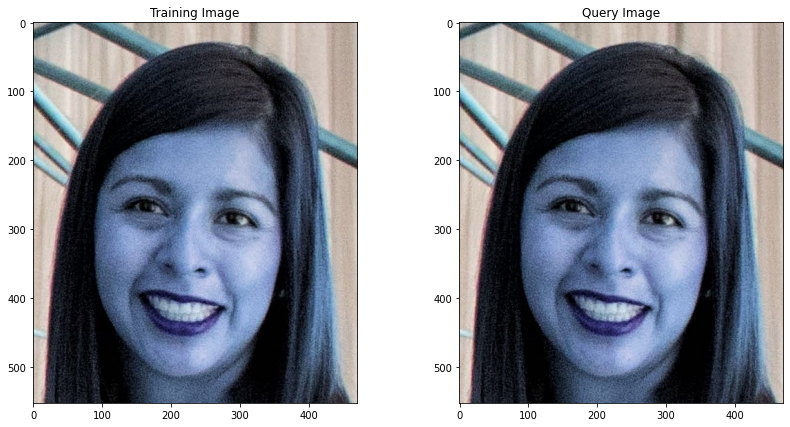

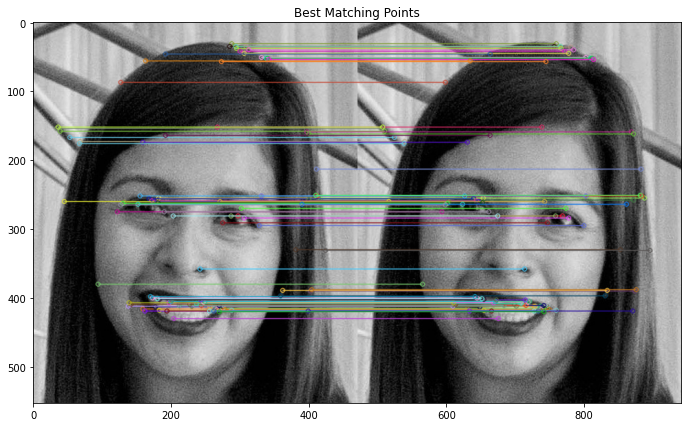

Number of Keypoints Detected In The Training Image:  821
Number of Keypoints Detected In The Query Image:  821

Number of Matching Keypoints Between The Training and Query Images:  821


In [3]:
train_face = cv2.imread('images/face.jpeg')
query_face = cv2.imread('images/face.jpeg')

rgb_train = cv2.cvtColor(train_face,cv2.COLOR_BGR2RGB)
gray_train = cv2.cvtColor(train_face,cv2.COLOR_BGR2GRAY)

rgb_query = cv2.cvtColor(query_face,cv2.COLOR_BGR2RGB)
gray_query = cv2.cvtColor(query_face,cv2.COLOR_BGR2GRAY)
plt.rcParams['figure.figsize'] = [14.0,7.0]

plt.subplot(121)
plt.title('Training Image')
plt.imshow(train_face)
plt.subplot(122)
plt.title('Query Image')
plt.imshow(query_face)
plt.show()

orb = cv2.ORB_create(1000,2.0)

train_keypoints, train_descriptors = orb.detectAndCompute(rgb_train,None)
query_keypoints, query_descriptors = orb.detectAndCompute(rgb_query,None)

brute_force_matcher = cv2.BFMatcher(cv2.NORM_HAMMING,crossCheck=True)

matches = brute_force_matcher.match(train_descriptors,query_descriptors)

matches = sorted(matches, key = lambda x : x.distance)

result = cv2.drawMatches(gray_train,train_keypoints,gray_query,query_keypoints,matches[:100],gray_query,flags=2)

plt.title('Best Matching Points')
plt.imshow(result)
plt.show()

# Print the number of keypoints detected in the training image
print("Number of Keypoints Detected In The Training Image: ", len(train_keypoints))

# Print the number of keypoints detected in the query image
print("Number of Keypoints Detected In The Query Image: ", len(query_keypoints))

# Print total number of matching points between the training and query images
print("\nNumber of Matching Keypoints Between The Training and Query Images: ", len(matches))

# ORB's Main Properties
We will now explore each of the main properties of the ORB algorithm:

- Scale Invariance
- Rotational Invariance
- Illumination Invariance
- Noise Invariance

Again, in order to see the properties of the ORB algorithm more clearly, in the following examples we will use the same image as our training and query image.

## 1. Scale Invariance
The ORB algorithm is scale invariant. This means that it is able to detect objects in images regardless of their size. To see this, we will now use our Brute-Force matcher to match points between the training image and a query image that is a ¼ the size of the original training image.

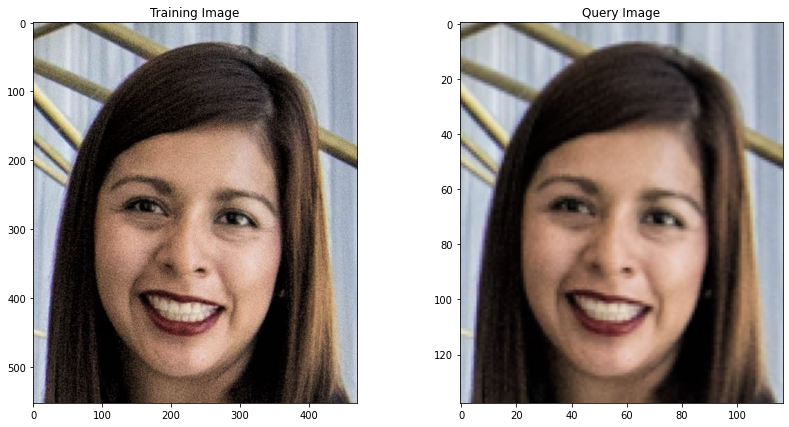

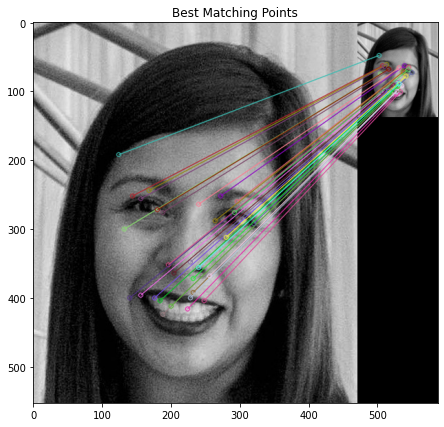


The Training Image has shape: (553, 471)
The Query Image has shape: (138, 117)

Number of Keypoints Detected In The Training Image:  821
Number of Keypoints Detected In The Query Image:  65

Number of Matching Keypoints Between The Training and Query Images:  57


In [8]:
# Set the default figure size
plt.rcParams['figure.figsize'] = [14.0, 7.0]

# Load the training image
image1 = cv2.imread('./images/face.jpeg')

# Load the query image
image_small = cv2.imread('./images/faceQS.png')

# Convert the training image to RGB
training_image = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)

# Convert the query image to RGB
query_image = cv2.cvtColor(image_small, cv2.COLOR_BGR2RGB)

# Display the images
plt.subplot(121)
plt.title('Training Image')
plt.imshow(training_image)
plt.subplot(122)
plt.title('Query Image')
plt.imshow(query_image)
plt.show()


# Convert the training image to gray scale
training_gray = cv2.cvtColor(training_image, cv2.COLOR_BGR2GRAY)

# Convert the query image to gray scale
query_gray = cv2.cvtColor(query_image, cv2.COLOR_BGR2GRAY)

# Set the parameters of the ORB algorithm by specifying the maximum number of keypoints to locate and
# the pyramid decimation ratio
orb = cv2.ORB_create(1000, 2.0)

# Find the keypoints in the gray scale training and query images and compute their ORB descriptor.
# The None parameter is needed to indicate that we are not using a mask in either case.
keypoints_train, descriptors_train = orb.detectAndCompute(training_gray, None)
keypoints_query, descriptors_query = orb.detectAndCompute(query_gray, None)

# Create a Brute Force Matcher object. Set crossCheck to True so that the BFMatcher will only return consistent
# pairs. Such technique usually produces best results with minimal number of outliers when there are enough matches.
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck = True)

# Perform the matching between the ORB descriptors of the training image and the query image
matches = bf.match(descriptors_train, descriptors_query)

# The matches with shorter distance are the ones we want. So, we sort the matches according to distance
matches = sorted(matches, key = lambda x : x.distance)

# Connect the keypoints in the training image with their best matching keypoints in the query image.
# The best matches correspond to the first elements in the sorted matches list, since they are the ones
# with the shorter distance. We draw the first 30 mathces and use flags = 2 to plot the matching keypoints
# without size or orientation.
result = cv2.drawMatches(training_gray, keypoints_train, query_gray, keypoints_query, matches[:30], query_gray, flags = 2)

# Display the best matching points
plt.title('Best Matching Points')
plt.imshow(result)
plt.show()

# Print the shape of the training image
print('\nThe Training Image has shape:', training_gray.shape)

#Print the shape of the query image
print('The Query Image has shape:', query_gray.shape)

# Print the number of keypoints detected in the training image
print("\nNumber of Keypoints Detected In The Training Image: ", len(keypoints_train))

# Print the number of keypoints detected in the query image
print("Number of Keypoints Detected In The Query Image: ", len(keypoints_query))

# Print total number of matching points between the training and query images
print("\nNumber of Matching Keypoints Between The Training and Query Images: ", len(matches))

## 2. Rotational Invariance
The ORB algorithm is also rotationally invariant. This means that it is able to detect objects in images regardless of their orientation. To see this, we will now use our Brute-Force matcher to match points between the training image and a query image that has been rotated by 90 degrees.

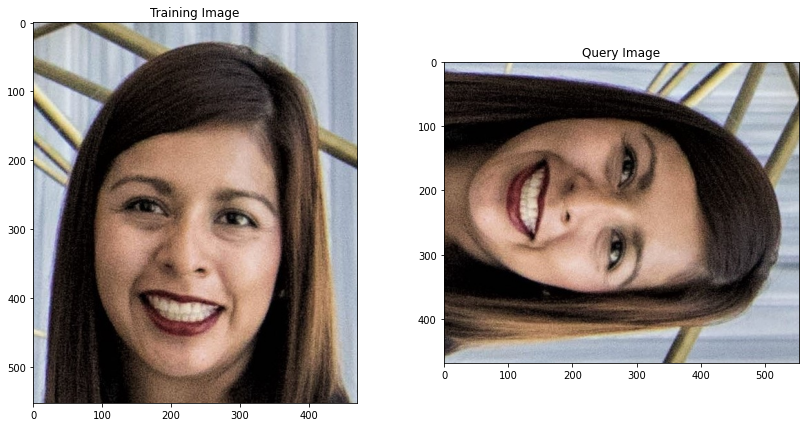

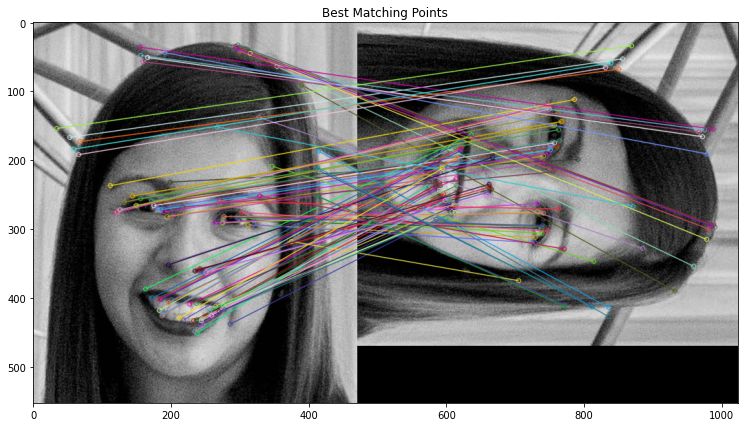


Number of Keypoints Detected In The Training Image:  821
Number of Keypoints Detected In The Query Image:  832

Number of Matching Keypoints Between The Training and Query Images:  617


In [11]:
# Set the default figure size
plt.rcParams['figure.figsize'] = [14.0, 7.0]

# Load the training image
image1 = cv2.imread('./images/face.jpeg')

# Load the query image
image_rotated = cv2.imread('./images/faceR.jpeg')

train_image = cv2.cvtColor(image1,cv2.COLOR_BGR2RGB)
query_image = cv2.cvtColor(image_rotated,cv2.COLOR_BGR2RGB)

# Display the images
plt.subplot(121)
plt.title('Training Image')
plt.imshow(training_image)
plt.subplot(122)
plt.title('Query Image')
plt.imshow(query_image)
plt.show()

training_gray = cv2.cvtColor(train_image,cv2.COLOR_RGB2GRAY)
query_gray = cv2.cvtColor(query_image,cv2.COLOR_RGB2GRAY)

orb = cv2.ORB_create(1000, 2.0)

keypoints_train,descriptors_train = orb.detectAndCompute(train_image,None)
keypoints_query,descriptors_query = orb.detectAndCompute(query_image,None)

bf = cv2.BFMatcher(cv2.NORM_HAMMING,crossCheck = True)

matches = bf.match(descriptors_train,descriptors_query)

matches = sorted(matches, key = lambda x:x.distance)

results = cv2.drawMatches(training_gray,keypoints_train,query_gray,keypoints_query,matches[:100],query_gray,flags=2)

plt.title('Best Matching Points')
plt.imshow(results)
plt.show()

# Print the number of keypoints detected in the training image
print("\nNumber of Keypoints Detected In The Training Image: ", len(keypoints_train))

# Print the number of keypoints detected in the query image
print("Number of Keypoints Detected In The Query Image: ", len(keypoints_query))

# Print total number of matching points between the training and query images
print("\nNumber of Matching Keypoints Between The Training and Query Images: ", len(matches))

## Illumination Invariance
The ORB algorithm is also illumination invariant. This means that it is able to detect objects in images regardless of their illumination. To see this, we will now use our Brute-Force matcher to match points between the training image and a query image that is much brighter.

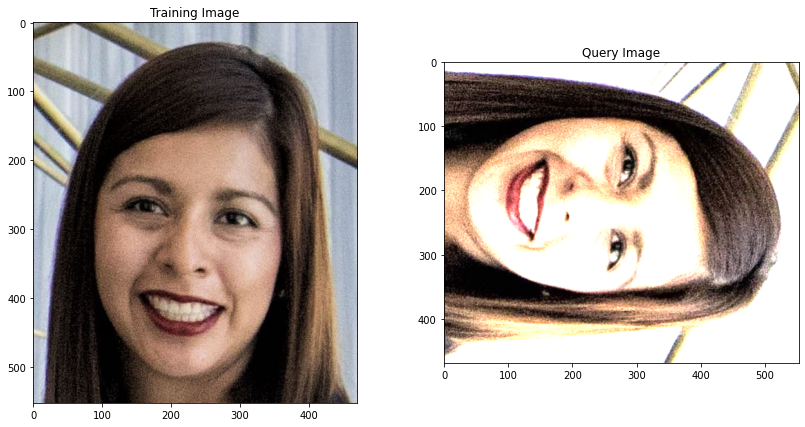

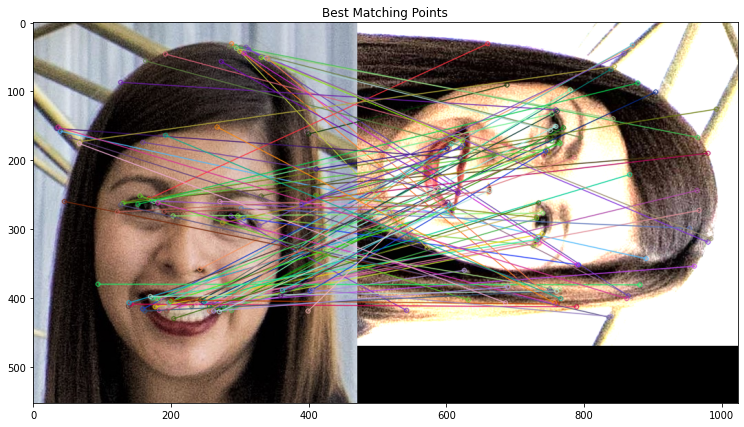


Number of Keypoints Detected In The Training Image:  821
Number of Keypoints Detected In The Query Image:  832

Number of Matching Keypoints Between The Training and Query Images:  821


In [13]:
image_illumination = cv2.imread('images/faceRI.png')
plt.rcParams['figure.figsize'] = [14,7]
query_image = cv2.cvtColor(image_illumination,cv2.COLOR_BGR2RGB)
query_gray = cv2.cvtColor(query_image,cv2.COLOR_RGB2GRAY)

plt.subplot(121)
plt.title('Training Image')
plt.imshow(training_image)
plt.subplot(122)
plt.title('Query Image')
plt.imshow(query_image)
plt.show()

orb = cv2.ORB_create(1000,2.0)

# keypoints_train,descriptors_train = cv2.detectAndCompute(train_image,None)
keypoint_query, descriptors_query = orb.detectAndCompute(query_image,None)

matches = brute_force_matcher.match(train_descriptors,query_descriptors)
matches = sorted(matches,key = lambda x:x.distance)

result = cv2.drawMatches(train_image,keypoints_train,query_image,keypoint_query,matches[:100],query_gray,flags=2)

# Display the best matching points
plt.title('Best Matching Points')
plt.imshow(result)
plt.show()

# Print the number of keypoints detected in the training image
print("\nNumber of Keypoints Detected In The Training Image: ", len(keypoints_train))

# Print the number of keypoints detected in the query image
print("Number of Keypoints Detected In The Query Image: ", len(keypoints_query))

# Print total number of matching points between the training and query images
print("\nNumber of Matching Keypoints Between The Training and Query Images: ", len(matches))

## Noise Invariance
The ORB algorithm is also noise invariant. This means that it is able to detect objects in images, even if the images have some degree of noise. To see this, we will now use our Brute-Force matcher to match points between the training image and a query image that has a lot of noise.

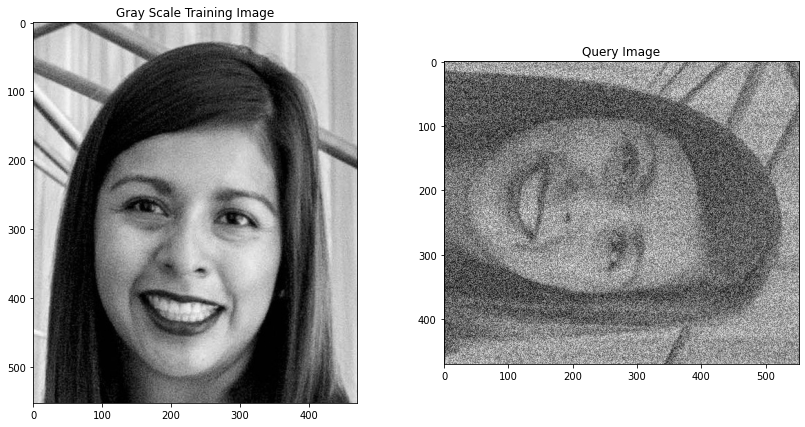

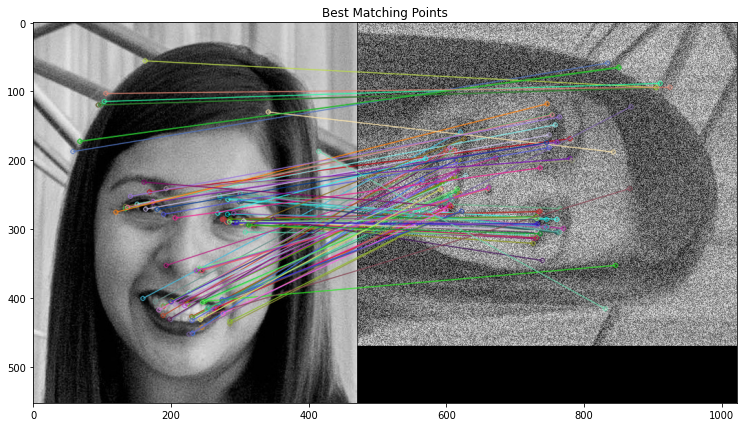

Number of Keypoints Detected In The Training Image:  903
Number of Keypoints Detected In The Query Image:  925

Number of Matching Keypoints Between The Training and Query Images:  260


In [14]:
# Set the default figure size
plt.rcParams['figure.figsize'] = [14.0, 7.0]

# Load the training image
image1 = cv2.imread('./images/face.jpeg')

# Load the noisy, gray scale query image. 
image2 = cv2.imread('./images/faceRN5.png')

# Convert the query image to gray scale
query_gray = cv2.cvtColor(image2, cv2.COLOR_BGR2GRAY)

# Convert the training image to gray scale
training_gray = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)

# Display the images
plt.subplot(121)
plt.imshow(training_gray, cmap = 'gray')
plt.title('Gray Scale Training Image')
plt.subplot(122)
plt.imshow(query_gray, cmap = 'gray')
plt.title('Query Image')
plt.show()
# Set the parameters of the ORB algorithm by specifying the maximum number of keypoints to locate and
# the pyramid decimation ratio
orb = cv2.ORB_create(1000, 1.3)

# Find the keypoints in the gray scale training and query images and compute their ORB descriptor.
# The None parameter is needed to indicate that we are not using a mask in either case. 
keypoints_train, descriptors_train = orb.detectAndCompute(training_gray, None)
keypoints_query, descriptors_query = orb.detectAndCompute(query_gray, None)

# Create a Brute Force Matcher object. We set crossCheck to True so that the BFMatcher will only return consistent
# pairs. Such technique usually produces best results with minimal number of outliers when there are enough matches.
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck = True)

# Perform the matching between the ORB descriptors of the training image and the query image
matches = bf.match(descriptors_train, descriptors_query)

# The matches with shorter distance are the ones we want. So, we sort the matches according to distance
matches = sorted(matches, key = lambda x : x.distance)

# Connect the keypoints in the training image with their best matching keypoints in the query image.
# The best matches correspond to the first elements in the sorted matches list, since they are the ones
# with the shorter distance. We draw the first 100 mathces and use flags = 2 to plot the matching keypoints
# without size or orientation.
result = cv2.drawMatches(training_gray, keypoints_train, query_gray, keypoints_query, matches[:100], query_gray, flags = 2)

# we display the image
plt.title('Best Matching Points')
plt.imshow(result)
plt.show()

# Print the number of keypoints detected in the training image
print("Number of Keypoints Detected In The Training Image: ", len(keypoints_train))

# Print the number of keypoints detected in the query image
print("Number of Keypoints Detected In The Query Image: ", len(keypoints_query))

# Print total number of matching points between the training and query images
print("\nNumber of Matching Keypoints Between The Training and Query Images: ", len(matches))

## Object Detection
We will now implement the ORB algorithm to detect the face in the training image in another image. As usual, we will start by loading our training and query images

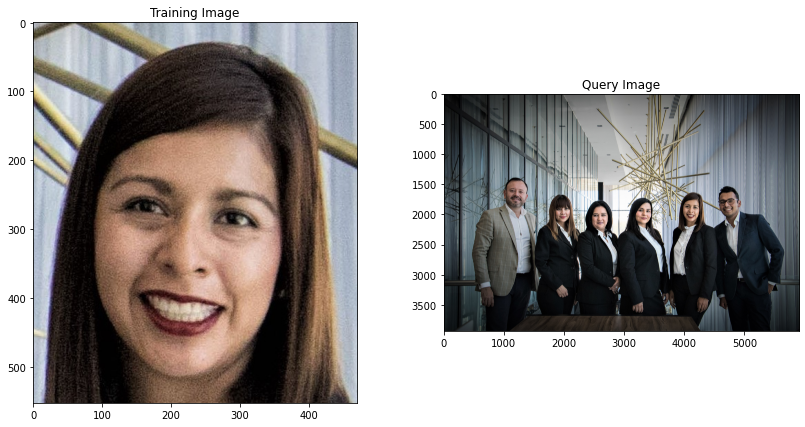

In [15]:
# Set the default figure size
plt.rcParams['figure.figsize'] = [14.0, 7.0]

# Load the training image
image1 = cv2.imread('./images/face.jpeg')

# Load the query image
image2 = cv2.imread('./images/Team.jpeg')

# Convert the training image to RGB
training_image = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)

# Convert the query image to RGB
query_image = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

# Display the images
plt.subplot(121)
plt.imshow(training_image)
plt.title('Training Image')
plt.subplot(122)
plt.imshow(query_image)
plt.title('Query Image')
plt.show()

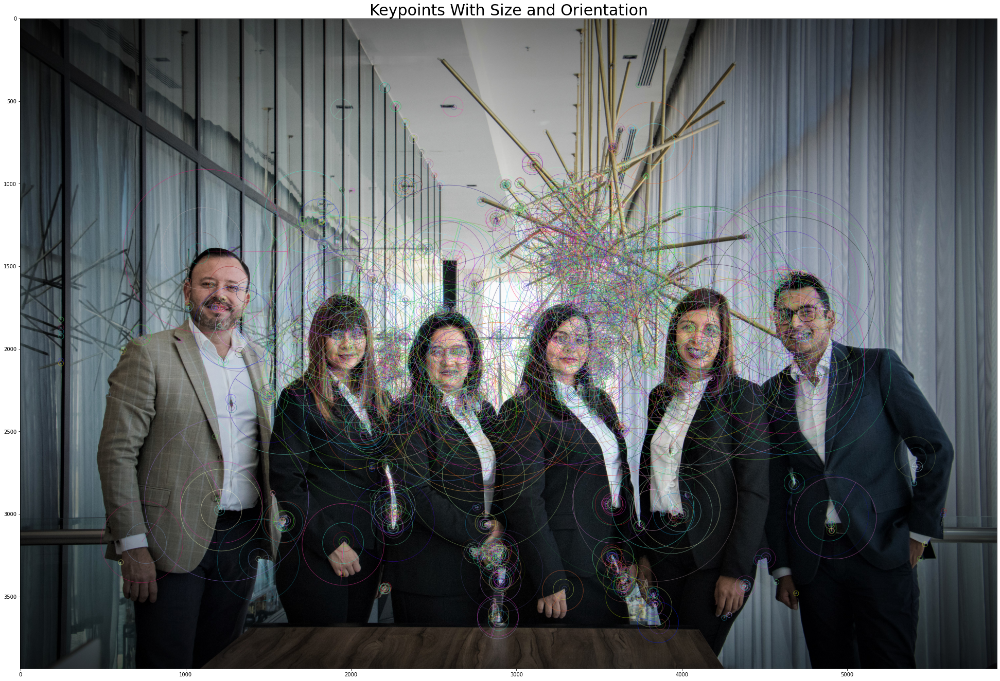


Number of keypoints Detected:  4941


In [19]:
# Set the default figure size
plt.rcParams['figure.figsize'] = [34.0, 34.0]

# Convert the training image to gray scale
training_gray = cv2.cvtColor(training_image, cv2.COLOR_BGR2GRAY)

# Convert the query image to gray scale
query_gray = cv2.cvtColor(query_image, cv2.COLOR_BGR2GRAY)

# Set the parameters of the ORB algorithm by specifying the maximum number of keypoints to locate and
# the pyramid decimation ratio
orb = cv2.ORB_create(5000, 2.0)

# Find the keypoints in the gray scale training and query images and compute their ORB descriptor.
# The None parameter is needed to indicate that we are not using a mask in either case.  
keypoints_train, descriptors_train = orb.detectAndCompute(training_gray, None)
keypoints_query, descriptors_query = orb.detectAndCompute(query_gray, None)

# Create copies of the query images to draw our keypoints on
query_img_keyp = copy.copy(query_image)

# Draw the keypoints with size and orientation on the copy of the query image
cv2.drawKeypoints(query_image, keypoints_query, query_img_keyp, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Display the query image with the keypoints with size and orientation
plt.title('Keypoints With Size and Orientation', fontsize = 30)
plt.imshow(query_img_keyp)
plt.show()

# Print the number of keypoints detected
print("\nNumber of keypoints Detected: ", len(keypoints_query))

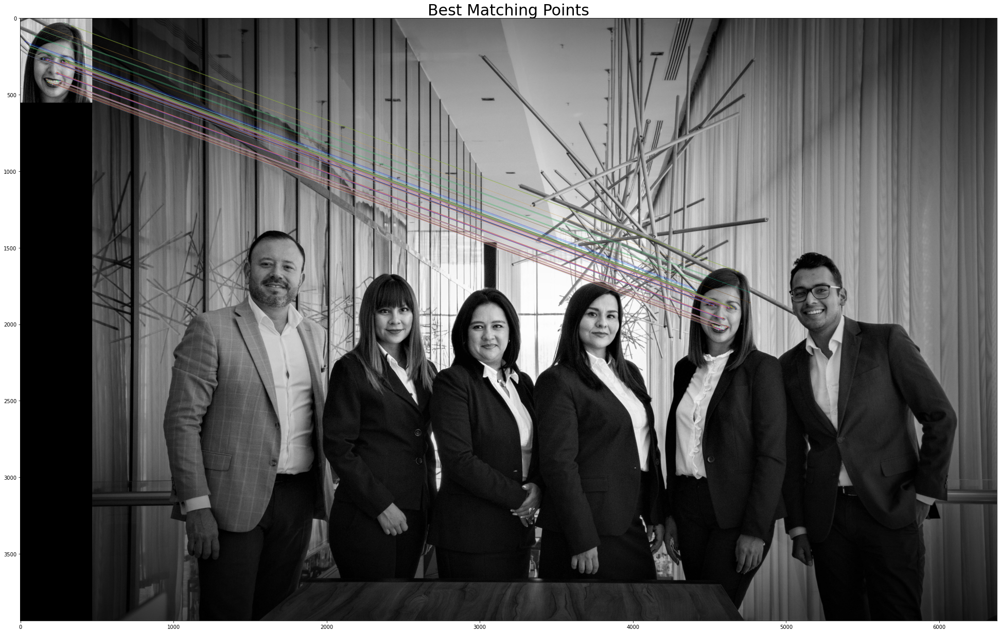

Number of Keypoints Detected In The Training Image:  2488
Number of Keypoints Detected In The Query Image:  4941

Number of Matching Keypoints Between The Training and Query Images:  668


In [20]:
# Set the default figure size
plt.rcParams['figure.figsize'] = [34.0, 34.0]

# Create a Brute Force Matcher object. We set crossCheck to True so that the BFMatcher will only return consistent
# pairs. Such technique usually produces best results with minimal number of outliers when there are enough matches.
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck = True)

# Perform the matching between the ORB descriptors of the training image and the query image
matches = bf.match(descriptors_train, descriptors_query)

# The matches with shorter distance are the ones we want. So, we sort the matches according to distance
matches = sorted(matches, key = lambda x : x.distance)

# Connect the keypoints in the training image with their best matching keypoints in the query image.
# The best matches correspond to the first elements in the sorted matches list, since they are the ones
# with the shorter distance. We draw the first 85 mathces and use flags = 2 to plot the matching keypoints
# without size or orientation.
result = cv2.drawMatches(training_gray, keypoints_train, query_gray, keypoints_query, matches[:85], query_gray, flags = 2)

# we display the image
plt.title('Best Matching Points', fontsize = 30)
plt.imshow(result)
plt.show()


# Print the number of keypoints detected in the training image
print("Number of Keypoints Detected In The Training Image: ", len(keypoints_train))

# Print the number of keypoints detected in the query image
print("Number of Keypoints Detected In The Query Image: ", len(keypoints_query))

# Print total number of matching Keypoints between the training and query images
print("\nNumber of Matching Keypoints Between The Training and Query Images: ", len(matches))